In [90]:
# csv 파일을 txt로 변환 (xrs)
import csv
for i in range(31):
    numbers = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18','19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31']
    infile_list = ['/Users/chuck/Desktop/3-1/Solar-Terrestrial Physics I/우주환경1 과제/GOES-15 xrs csv/2011_5/g15_xrs_2s_201105'+numbers[i]+'_201105'+numbers[i]+'.csv' for x in numbers]
    outfile = '/Users/chuck/Desktop/3-1/Solar-Terrestrial Physics I/우주환경1 과제/GOES-15 xrs csv/2011_5/g15_xrs_2s_201105'+numbers[i]+'.txt'
    with open(infile_list[i], 'r') as IF:
        with open(outfile, 'w') as OF:
            csv_reader = csv.reader(IF)
            for row in csv_reader:
                OF.write('\t'.join(row) + '\n')
OF.close()
IF.close()

In [91]:
# txt 파일의 header 없애기
for i in range(31):
    numbers = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18','19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31']
    infile_list = ['/Users/chuck/Desktop/3-1/Solar-Terrestrial Physics I/우주환경1 과제/GOES-15 xrs csv/2011_5/g15_xrs_2s_201105'+numbers[i]+'.txt' for x in numbers]
    outfile = '/Users/chuck/Desktop/3-1/Solar-Terrestrial Physics I/우주환경1 과제/GOES-15 xrs csv/2011_5/g15_xrs_2s_201105'+numbers[i]+'_rev.txt'
    with open(infile_list[i], 'r') as IF:
        for row in range(0, 140):
            next(IF)
        with open(outfile, 'w') as OF:
            for line in IF:
                OF.write(line)
OF.close()
IF.close()

In [92]:
# txt 파일 합치기

numbers = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18','19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31']
infile_list = ['/Users/chuck/Desktop/3-1/Solar-Terrestrial Physics I/우주환경1 과제/GOES-15 xrs csv/2011_5/g15_xrs_2s_201105'+x+'_rev.txt' for x in numbers]

combined_content = ''

for f in infile_list:
    with open(f, 'r') as content:
        contents = content.read()
        combined_content += contents
content.close()

outfile = '/Users/chuck/Desktop/3-1/Solar-Terrestrial Physics I/우주환경1 과제/GOES-15 xrs csv/2011_5/g15_xrs_2s_201105.txt'
with open(outfile, 'w') as OF:
    OF.write(combined_content)
OF.close()

In [93]:
# txt 파일 종합
numbers = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']
infile_list = ['/Users/chuck/Desktop/3-1/Solar-Terrestrial Physics I/우주환경1 과제/GOES-15 xrs csv/total/g15_xrs_2s_2011' +x+'.txt' for x in numbers]

combined_content = ''
for f in infile_list:
    with open(f, 'r') as content:
        contents = content.read()
        combined_content += contents
content.close()

outfile = '/Users/chuck/Desktop/3-1/Solar-Terrestrial Physics I/우주환경1 과제/GOES-15 xrs csv/total/g15_xrs_2s_2011.txt'
with open(outfile, 'w') as OF:
    OF.write(combined_content)
OF.close()

In [94]:
# 확인 및 분리
file = '/Users/chuck/Desktop/3-1/Solar-Terrestrial Physics I/우주환경1 과제/GOES-15 xrs csv/total/g15_xrs_2s_2011.txt'
with open(file, 'r') as F:
    data = F.readlines()

time_arr, a_flux, b_flux = [[], [], []]
a_flag, b_flag = [[], []]

for line in data:
    line = line.strip()
    column = line.split()
    time_arr.append(column[0] + ' ' +column[1])
    a_flag.append(float(column[2]))
    a_flux.append(column[4])
    b_flag.append(float(column[5]))
    b_flux.append(column[7])

print(time_arr[0:5])
#print(p3e_flag)
#print(p3e_flux)
#print(len(time_arr))
#print(len(p3e_flag))
print(len(data))
print(b_flux[:10])

['2011-01-01 00:00:03.750', '2011-01-01 00:00:05.797', '2011-01-01 00:00:07.847', '2011-01-01 00:00:09.893', '2011-01-01 00:00:11.943']
15366780
['1.7559E-07', '1.7822E-07', '1.7559E-07', '1.7559E-07', '1.7559E-07', '1.7559E-07', '1.7559E-07', '1.7559E-07', '1.7559E-07', '1.7559E-07']


In [98]:
# 이상 데이터가 있는지 확인

error_ind = []

for i in range(len(a_flag)):
    if a_flag[i] != 0.0:
        error_ind.append(i)

print(len(error_ind))

176272


In [96]:
# dataframe

import pandas as pd
data = pd.DataFrame({'Time':time_arr, 'A_FLUX':a_flux, 'B_FLUX':b_flux})
print(data, type(data))

                             Time      A_FLUX      B_FLUX
0         2011-01-01 00:00:03.750  1.0000E-09  1.7559E-07
1         2011-01-01 00:00:05.797  1.0000E-09  1.7822E-07
2         2011-01-01 00:00:07.847  1.0000E-09  1.7559E-07
3         2011-01-01 00:00:09.893  1.0000E-09  1.7559E-07
4         2011-01-01 00:00:11.943  1.0000E-09  1.7559E-07
...                           ...         ...         ...
15366775  2011-12-31 23:59:51.163  1.0000E-09  4.6153E-07
15366776  2011-12-31 23:59:53.210  1.0000E-09  4.6153E-07
15366777  2011-12-31 23:59:55.260  1.0000E-09  4.6153E-07
15366778  2011-12-31 23:59:57.307  1.0000E-09  4.5890E-07
15366779  2011-12-31 23:59:59.357  1.0000E-09  4.5628E-07

[15366780 rows x 3 columns] <class 'pandas.core.frame.DataFrame'>


In [99]:
# Time 열을 datetime으로 변경, '숫자' 자료형 부여
data_p = data.copy()
data_p['Time'] = pd.to_datetime(data_p['Time'])
data_p['A_FLUX'] = pd.to_numeric(data_p['A_FLUX'])
data_p['B_FLUX'] = pd.to_numeric(data_p['B_FLUX'])
print(data_p)
print(data_p.dtypes)

                            Time        A_FLUX        B_FLUX
0        2011-01-01 00:00:03.750  1.000000e-09  1.755900e-07
1        2011-01-01 00:00:05.797  1.000000e-09  1.782200e-07
2        2011-01-01 00:00:07.847  1.000000e-09  1.755900e-07
3        2011-01-01 00:00:09.893  1.000000e-09  1.755900e-07
4        2011-01-01 00:00:11.943  1.000000e-09  1.755900e-07
...                          ...           ...           ...
15366775 2011-12-31 23:59:51.163  1.000000e-09  4.615300e-07
15366776 2011-12-31 23:59:53.210  1.000000e-09  4.615300e-07
15366777 2011-12-31 23:59:55.260  1.000000e-09  4.615300e-07
15366778 2011-12-31 23:59:57.307  1.000000e-09  4.589000e-07
15366779 2011-12-31 23:59:59.357  1.000000e-09  4.562800e-07

[15366780 rows x 3 columns]
Time      datetime64[ns]
A_FLUX           float64
B_FLUX           float64
dtype: object


(array([-120000., -100000.,  -80000.,  -60000.,  -40000.,  -20000.,
              0.,   20000.]),
 [Text(0, -120000.0, '−120000'),
  Text(0, -100000.0, '−100000'),
  Text(0, -80000.0, '−80000'),
  Text(0, -60000.0, '−60000'),
  Text(0, -40000.0, '−40000'),
  Text(0, -20000.0, '−20000'),
  Text(0, 0.0, '0'),
  Text(0, 20000.0, '20000')])

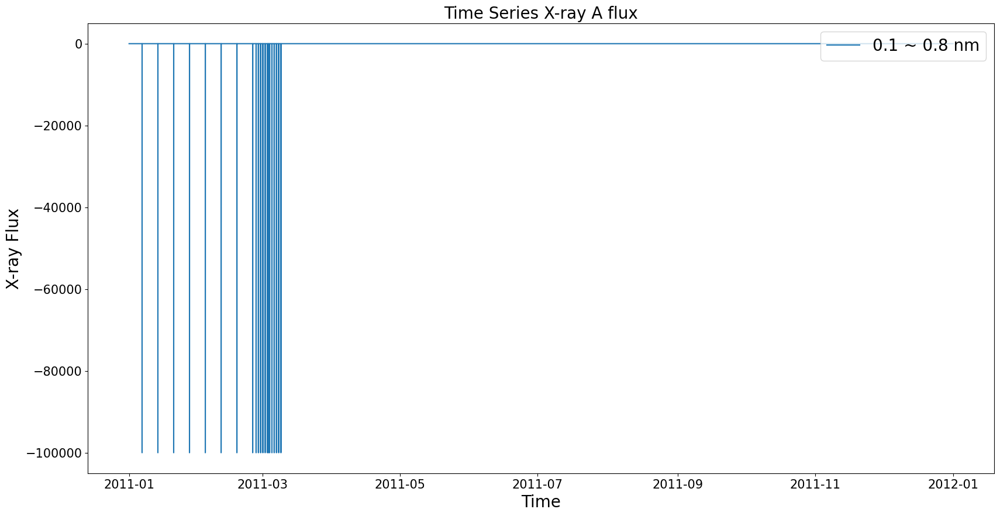

In [121]:
# 데이터 plot
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 10))
plt.plot(data_p['Time'], data_p['A_FLUX'], label='0.1 ~ 0.8 nm')
plt.title('Time Series X-ray A flux', fontsize=20)
plt.xlabel('Time', fontsize=20)
plt.ylabel('X-ray Flux',fontsize=20)
plt.legend(loc='upper right', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

In [101]:
# 보간을 위한 데이터 프레임 생성

data_interp = data_p.copy()
print(data_interp.dtypes)

print(data_interp['A_FLUX'][0:10])

Time      datetime64[ns]
A_FLUX           float64
B_FLUX           float64
dtype: object
0    1.000000e-09
1    1.000000e-09
2    1.000000e-09
3    1.000000e-09
4    1.000000e-09
5    1.000000e-09
6    1.000000e-09
7    1.000000e-09
8    1.000000e-09
9    1.000000e-09
Name: A_FLUX, dtype: float64


In [102]:
# 데이터 보간

import numpy as np
import warnings
warnings.filterwarnings('ignore')

for i in error_ind:
    data_interp['A_FLUX'][i] = np.nan
    data_interp['B_FLUX'][i] = np.nan
data_interp.interpolate(method='linear', inplace=True)

print(data_interp['A_FLUX'][0:10])


0    1.000000e-09
1    1.000000e-09
2    1.000000e-09
3    1.000000e-09
4    1.000000e-09
5    1.000000e-09
6    1.000000e-09
7    1.000000e-09
8    1.000000e-09
9    1.000000e-09
Name: A_FLUX, dtype: float64


In [103]:
# 결측치 제거 후 확인

for column_name in (list(data_interp.columns)[1:]):
    for i in error_ind:
        print(data_interp[column_name][i])
        print(data_p[column_name][i])

print(data_interp['A_FLUX'][0:10])

1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-99999.0
1e-09
-999

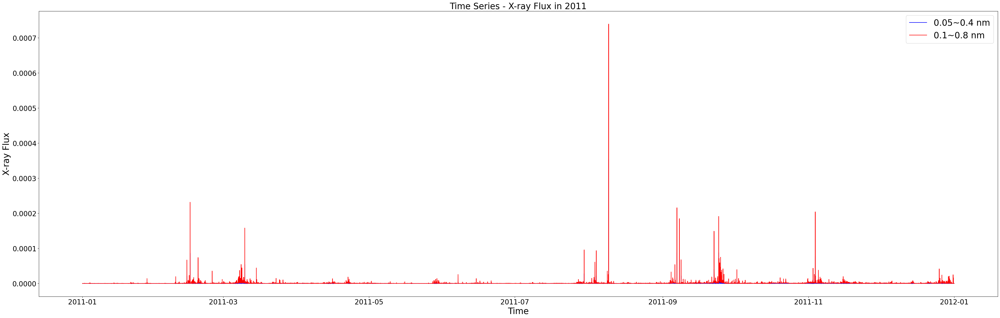

In [123]:
# 보간 후 데이터 plot

plt.figure(figsize=(50, 15))
plt.plot(data_interp['Time'][:], data_interp['A_FLUX'][:], label='0.05~0.4 nm', c='b')
plt.plot(data_interp['Time'][:], data_interp['B_FLUX'][:], label='0.1~0.8 nm', c='r')
plt.title('Time Series - X-ray Flux in 2011', fontsize=25)
plt.xlabel('Time', fontsize=25)
plt.ylabel('X-ray Flux', fontsize=25)
plt.yticks(fontsize = 20)
plt.xticks(fontsize=20)
plt.legend(fontsize=25)

In [106]:
# 시간 resampling

data_res = data_interp.copy()
data_res = data_res.set_index('Time')
data_res = data_res.resample('1T').mean()

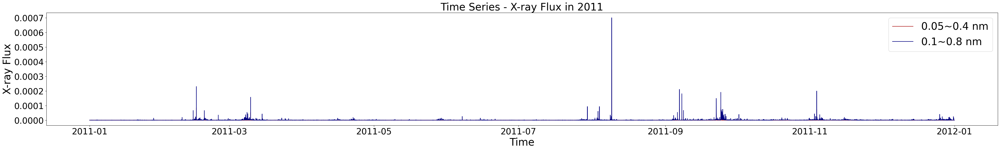

In [120]:
# 데이터 resampling 후 plot

plt.figure(figsize=(50, 6))
plt.plot(data_res.index, data_res['A_FLUX'][:], label='0.05~0.4 nm', c='firebrick')
plt.plot(data_res.index, data_res['B_FLUX'][:], label='0.1~0.8 nm', c='navy')
plt.title('Time Series - X-ray Flux in 2011', fontsize=30)
plt.xlabel('Time', fontsize=30)
plt.ylabel('X-ray Flux', fontsize=30)
plt.yticks(fontsize = 25)
plt.xticks(fontsize=25)
plt.legend(fontsize=30)